# Entrenamiento con YOLO v5 Nano

#Aplicación movil para detectar al menos cinco señales de transito

Entrenamiento utilizando arquitetura YOLO v5 para la detección de 6 señales de transito:



1.   Cruce Peatonal
2.   Parada de bus
3.   Pare
4.   Semaforo peatonal rojo
5.   Semaforo peatonal verde
6.   Proximidad de cruce de peatones











# 1. Se declaran dependencias

Se importan las dependencias de Yolo v5 de ultralytics y las librerias de robowflow y tensorflow.

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
import tensorflow as tf
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 15305, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 15305 (delta 0), reused 3 (delta 0), pack-reused 15300
Receiving objects: 100% (15305/15305), 14.19 MiB | 18.03 MiB/s, done.
Resolving deltas: 100% (10493/10493), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 2.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.9.0 requires jedi>=0.10, which is not installed.
cvxpy 1.2.3 requires setuptools<=64.0.2, but you have setuptools 67.6.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 3.5 MB/s eta 0:

# 2. Dataset

Se importan las librerias de Roboflow para descargar el dataset etiquetado con boulding box, el tamaño de las imagenes es de 640*640 y estan divididas en directorios de entrenamiento, validación y prueba.



In [2]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

Se descarga la versión actual o que queremos de las imagenes, indicando la arquitectura que se va a entrenar.

In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="FjRJBWAOVtNSsRDSP6ju")
project = rf.workspace("tesis-lhuim").project("senales-de-transito")
dataset = project.version(33).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to /content/datasets/Señales-de-transito-33 in yolov5pytorch:: 100%|██████████| 5542/5542 [00:01<00:00, 3908.02it/s]


Se identifican las clases a detectar.

In [ ]:
%cat {dataset.location}/data.yaml

names:
- Cruce peatonal
- Parada de bus
- Pare
- Semaforo peatonal rojo
- Semaforo peatonal verde
- proximidad de curce peatonal
nc: 6
roboflow:
  license: Public Domain
  project: senales-de-transito
  url: https://universe.roboflow.com/tesis-lhuim/senales-de-transito/dataset/34
  version: 34
  workspace: tesis-lhuim
test: ../test/images
train: "/content/datasets/Se\xF1ales-de-transito-34/train/images"
val: "/content/datasets/Se\xF1ales-de-transito-34/valid/images"


#3. Se visualiza la arquitectura Yolo v5 small a entrenar.

In [ ]:
#Arquitectura YOLOv5n
%cat /content/yolov5/models/yolov5n.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
#Arquitectura YOLOv5n
%cat /content/yolov5/data/hyps/hyp.scratch-low.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license
# Hyperparameters for low-augmentation COCO training from scratch
# python train.py --batch 64 --cfg yolov5n6.yaml --weights '' --data coco.yaml --img 640 --epochs 300 --linear
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials

lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#4. Evolución de Hiperparametros

In [ ]:
!python train.py --img 416 --batch 32 --epochs 10 --data {dataset.location}/data.yaml --weights yolov5n.pt --cache --evolve 50

train: weights=yolov5n.pt, cfg=, data=/content/datasets/Señales-de-transito-33/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=50, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-226-gfde7758 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0,

#5. Entrenamiento de la arquitectura


In [ ]:
!python train.py --img 416 --batch 64 --epochs 300 --data {dataset.location}/data.yaml --weights yolov5n.pt --hyp /content/yolov5/data/hyps/hyp_evolve.yaml --cache

train: weights=yolov5n.pt, cfg=, data=/content/datasets/Señales-de-transito-34/data.yaml, hyp=/content/yolov5/data/hyps/hyp_evolve.yaml, epochs=300, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-228-g6ae3dff Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.00821, lrf=0.01303, momentum=0.91189, weight_decay=0.00068, warmup_epochs=2.7139, warmup_momentum=0.65347, warmup_bias_lr=0.10248, box=0.07219, cls=0.42613, cls_pw=0.95472, obj=1.0954, ob

#6. Resultados de entrenamiento

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1000)  # view results.png

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images

# 7. Se realizan las inferencias en los datos de prueba y se visualizan.

Se toman lotes de imagenes para hacer inferecias en dichas imagenes de prueba, esto con el fin de mirar el rendimiento de detección del modelo.

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

#8. Se descarga el modelo entrenado.

Se descarga los pesos del modelo entranado final y se guarda en el drive.

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

Conjunto de imagenes de validacion con la etiqueta predicha.

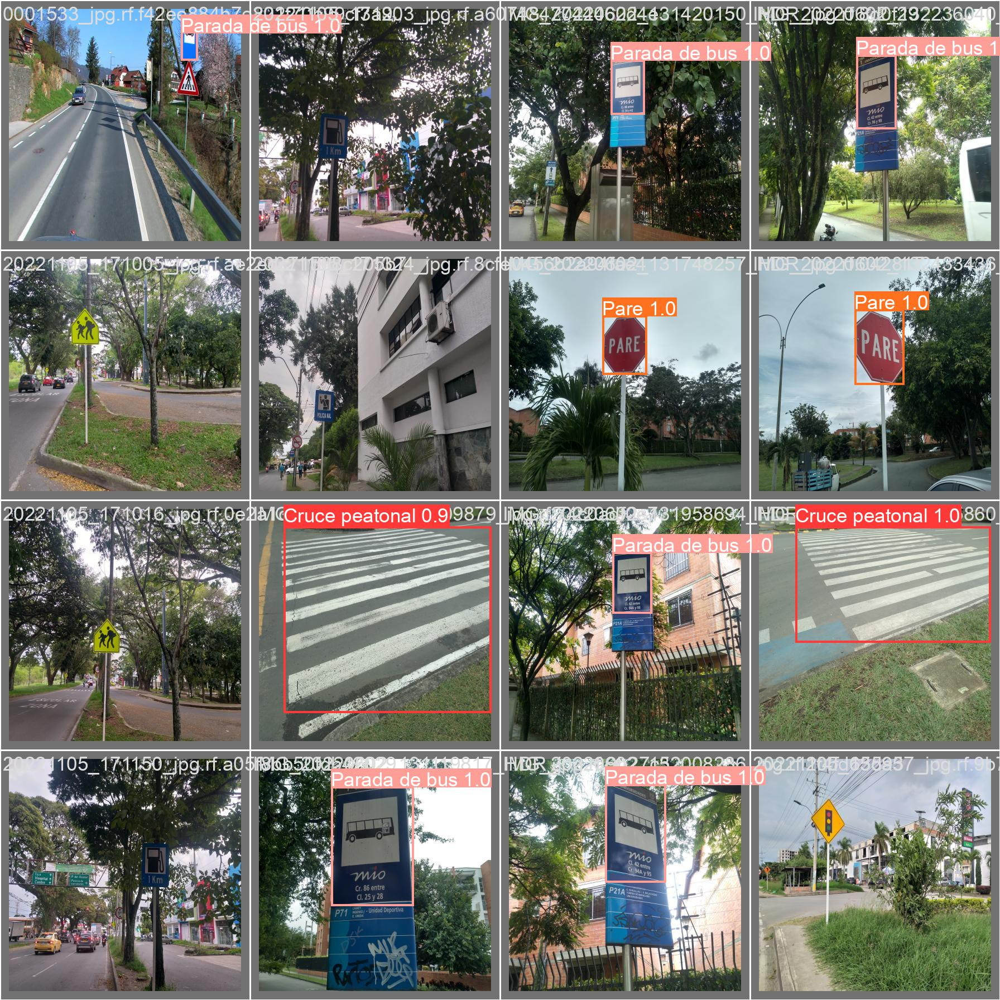

In [14]:
#Resultados batch0 de los datos de validación
Image(filename = '/content/yolov5/runs/val/exp3/val_batch0_pred.jpg',width=900)

#9. Se valida el modelo descargado en el drive

In [12]:
%cd /content/yolov5
# Run YOLOv5x on COCO val
!python3 val.py --weights '/content/drive/MyDrive/Colab Notebooks/Trabajodegrado/Yolov5NanoBG/Yolov5nanoBG416.pt' --data '/content/datasets/Señales-de-transito-33/data.yaml' --img 416 --iou 0.9 

/content/yolov5
val: data=/content/datasets/Señales-de-transito-33/data.yaml, weights=['/content/drive/MyDrive/Colab Notebooks/Trabajodegrado/Yolov5NanoBG/Yolov5nanoBG416.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.9, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 1762322 parameters, 0 gradients, 4.1 GFLOPs
100% 755k/755k [00:00<00:00, 131MB/s]
val: Scanning /content/datasets/Señales-de-transito-33/valid/labels... 274 images, 63 backgrounds, 0 corrupt: 100% 274/274 [00:00<00:00, 2058.29it/s]
val: New cache created: /content/datasets/Señales-de-transito-33/valid/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95

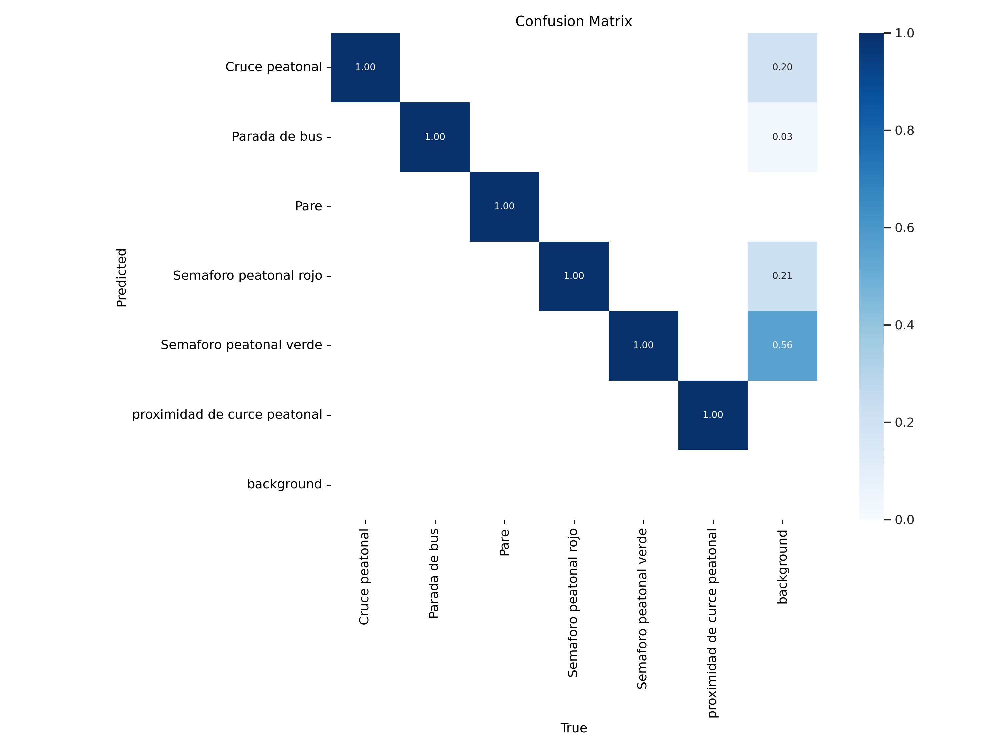

In [15]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/val/exp3/confusion_matrix.png', width=1000)  # view results.png

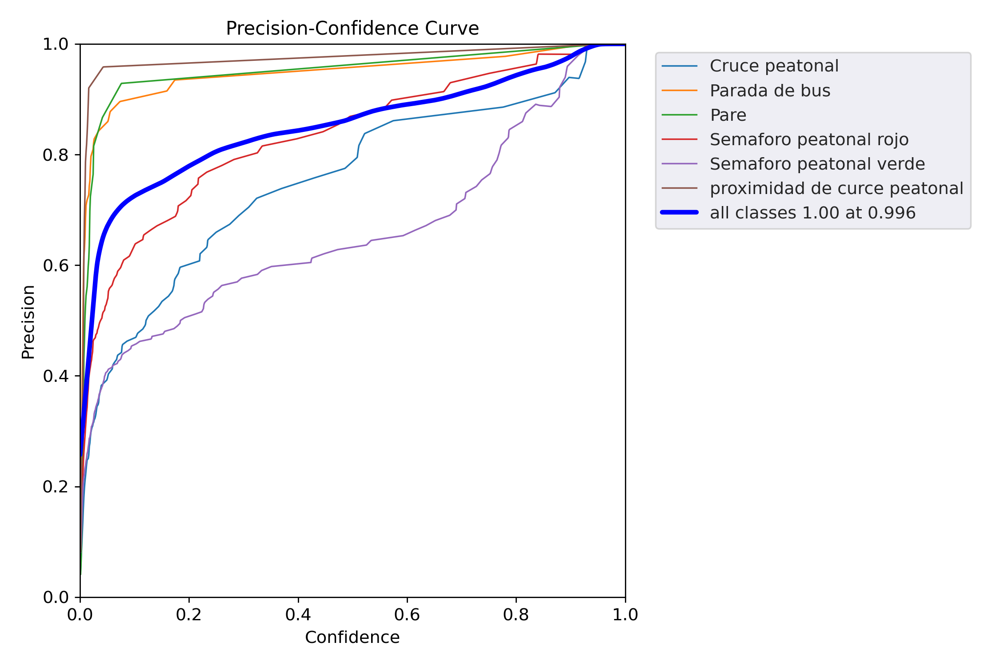

In [16]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/val/exp3/P_curve.png', width=1000)  # view results.png

#10. Exportar el modelo a Tensorflow Lite Modelo

In [ ]:
%cd /content/yolov5/
!python export.py --weights '/content/drive/MyDrive/Colab Notebooks/Trabajodegrado/Yolov5NanoBG/Yolov5nanoBG416.pt' --include tflite --img 416 

/content/yolov5
export: data=data/coco128.yaml, weights=['/content/drive/MyDrive/Colab Notebooks/Trabajodegrado/Yolov5NanoBGAug/Yolov5nanoBGAug.pt'], imgsz=[416], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v6.2-237-g55e9516 Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 1767283 parameters, 0 gradients, 4.2 GFLOPs

PyTorch: starting from /content/drive/MyDrive/Colab Notebooks/Trabajodegrado/Yolov5NanoBGAug/Yolov5nanoBGAug.pt with output shape (1, 10647, 11) (3.6 MB)

TensorFlow SavedModel: starting export with tensorflow 2.9.2...

                 from  n    params  module                                  arguments                     
2022-11-11 00:40:40.387468: E tensorflow/stream_executor/cuda/cuda_driver.c

In [ ]:
interpreter = tf.lite.Interpreter('/content/drive/MyDrive/Colab Notebooks/Trabajodegrado/YolonanoAugmentado416/YoloNanoAug-fp16.tflite')
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print("Input Shape:", input_details[0]['shape'])
print("Input Type:", input_details[0]['dtype'])
print("Output Shape:", output_details[0]['shape'])
print("Output Type:", output_details[0]['dtype'])

Input Shape: [  1 416 416   3]
Input Type: <class 'numpy.float32'>
Output Shape: [    1 10647    11]
Output Type: <class 'numpy.float32'>
